In [21]:
import pandas as pd
import seaborn as sns
import xgboost as xgb
import optuna
import sklearn
import matplotlib as plt
import numpy as np
import category_encoders as ce
import joblib
import catboost as cb


#  version info dictionary
versions = {
    "Pandas": pd.__version__,
    "Seaborn": sns.__version__,
    "XGBoost": xgb.__version__,
    "Optuna": optuna.__version__,
    "Scikit-learn": sklearn.__version__,
    "NumPy": np.__version__,
    "Matplotlib": plt.__version__,
    "Category Encoders": ce.__version__,
    "Joblib": joblib.__version__,
    "CatBoost": cb.__version__,
}

# Print versions 
print("Package Versions:")
print("-" * 40)
for package, version in versions.items():
    print(f"{package:.<25} v{version}")
print("-" * 40)

Package Versions:
----------------------------------------
Pandas................... v2.2.2
Seaborn.................. v0.13.2
XGBoost.................. v2.1.1
Optuna................... v4.0.0
Scikit-learn............. v1.5.1
NumPy.................... v1.26.4
Matplotlib............... v3.9.2
Category Encoders........ v2.6.4
Joblib................... v1.4.2
CatBoost................. v1.2.7
----------------------------------------


In [3]:
pwd 

'/Users/sadmansakib/Downloads/AdvanceML/adv_mla_at3/notebooks'

In [5]:
import pandas as pd

train_data = pd.read_csv('../data/processed/train_data.csv')
val_data = pd.read_csv('../data/processed/val_data.csv')
test_data = pd.read_csv('../data/processed/test_data.csv')

In [7]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 295736 entries, 0 to 295735
Data columns (total 19 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   startingAirport      295736 non-null  object 
 1   destinationAirport   295736 non-null  object 
 2   travelDuration       295736 non-null  float64
 3   isBasicEconomy       295736 non-null  int64  
 4   isRefundable         295736 non-null  bool   
 5   isNonStop            295736 non-null  bool   
 6   totalFare            295736 non-null  float64
 7   totalTravelDistance  295736 non-null  float64
 8   month                295736 non-null  int64  
 9   day                  295736 non-null  int64  
 10  day_of_week          295736 non-null  int64  
 11  week_of_year         295736 non-null  int64  
 12  date_diff            295736 non-null  int64  
 13  hour                 295736 non-null  int64  
 14  minute               295736 non-null  int64  
 15  cabin_Leg1       

In [25]:
# Convert boolean columns to integers for all datasets
for dataset in [train_data, val_data, test_data]:
    dataset['isRefundable'] = dataset['isRefundable'].astype(int)
    dataset['isNonStop'] = dataset['isNonStop'].astype(int)

In [26]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 295736 entries, 0 to 295735
Data columns (total 19 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   startingAirport      295736 non-null  object 
 1   destinationAirport   295736 non-null  object 
 2   travelDuration       295736 non-null  float64
 3   isBasicEconomy       295736 non-null  int64  
 4   isRefundable         295736 non-null  int64  
 5   isNonStop            295736 non-null  int64  
 6   totalFare            295736 non-null  float64
 7   totalTravelDistance  295736 non-null  float64
 8   month                295736 non-null  int64  
 9   day                  295736 non-null  int64  
 10  day_of_week          295736 non-null  int64  
 11  week_of_year         295736 non-null  int64  
 12  date_diff            295736 non-null  int64  
 13  hour                 295736 non-null  int64  
 14  minute               295736 non-null  int64  
 15  cabin_Leg1       

In [6]:
# Define target and features
target_column = 'totalFare'

# Define categorical and numerical features
categorical_features = [
    'startingAirport', 'destinationAirport',
    'cabin_Leg1', 'cabin_Leg2', 'cabin_Leg3', 'cabin_Leg4'
]

numerical_features = [
    'travelDuration', 'isBasicEconomy', 'isRefundable', 'isNonStop',
    'totalTravelDistance', 'month', 'day', 'day_of_week', 'week_of_year',
    'date_diff', 'hour', 'minute'
]

# Combine features
feature_columns = numerical_features + categorical_features

# Prepare training data
X_train = train_data[feature_columns]
y_train = train_data[target_column]

# Prepare validation data
X_val = val_data[feature_columns]
y_val = val_data[target_column]

# Prepare test data
X_test = test_data[feature_columns]
y_test = test_data[target_column]


In [8]:
# Get indices of categorical features
categorical_feature_indices = [
    X_train.columns.get_loc(col) for col in categorical_features
]

# Save categorical feature names for the backend
import joblib
joblib.dump(categorical_features, 'categorical_features.joblib')


['categorical_features.joblib']

In [10]:
from catboost import CatBoostRegressor
from sklearn.metrics import root_mean_squared_error, mean_absolute_error

# Initialize CatBoost model
model = CatBoostRegressor(
    iterations=1000,
    learning_rate=0.1,
    depth=6,
    loss_function='RMSE',
    eval_metric='RMSE',
    random_seed=42,
    early_stopping_rounds=50,
    cat_features=categorical_features,
    verbose=100
)

# Train the model
model.fit(
    X_train,
    y_train,
    eval_set=(X_val, y_val),
    use_best_model=True
)

# Make predictions on validation set
val_predictions = model.predict(X_val)

# Calculate RMSE and MAE directly
rmse = root_mean_squared_error(y_val, val_predictions)
mae = mean_absolute_error(y_val, val_predictions)

print("\nValidation Metrics:")
print(f"RMSE: ${rmse:.2f}")
print(f"MAE: ${mae:.2f}")

0:	learn: 215.5207910	test: 221.6218388	best: 221.6218388 (0)	total: 103ms	remaining: 1m 43s
100:	learn: 142.4592454	test: 147.9300459	best: 147.9300459 (100)	total: 2.9s	remaining: 25.8s
200:	learn: 132.6264260	test: 138.6032241	best: 138.6032241 (200)	total: 5.86s	remaining: 23.3s
300:	learn: 126.4998163	test: 132.8644128	best: 132.8644128 (300)	total: 8.95s	remaining: 20.8s
400:	learn: 121.7541126	test: 128.5543988	best: 128.5543988 (400)	total: 12s	remaining: 17.9s
500:	learn: 118.5750239	test: 125.6044222	best: 125.6044222 (500)	total: 15s	remaining: 15s
600:	learn: 116.1019663	test: 123.3632278	best: 123.3632278 (600)	total: 18.2s	remaining: 12.1s
700:	learn: 113.7509001	test: 121.1672051	best: 121.1672051 (700)	total: 21.3s	remaining: 9.09s
800:	learn: 111.9294349	test: 119.5556169	best: 119.5556169 (800)	total: 24.4s	remaining: 6.05s
900:	learn: 110.3780913	test: 118.1195284	best: 118.1195284 (900)	total: 27.4s	remaining: 3.01s
999:	learn: 108.8422013	test: 116.7513804	best: 11

[I 2024-11-04 08:06:04,353] A new study created in memory with name: no-name-03133d15-e314-44b0-99ba-b617ddbea50a
[I 2024-11-04 08:12:17,457] Trial 21 finished with value: 156.06533143342594 and parameters: {'iterations': 593, 'learning_rate': 0.02471576685618851, 'depth': 4, 'l2_leaf_reg': 1.8790240628483191e-06, 'min_child_samples': 74, 'subsample': 0.8402487525346058, 'colsample_bylevel': 0.7792546387960828, 'random_strength': 8.807250090739235}. Best is trial 21 with value: 156.06533143342594.
[I 2024-11-04 08:13:11,568] Trial 20 finished with value: 135.95760952864015 and parameters: {'iterations': 680, 'learning_rate': 0.08779604723454446, 'depth': 4, 'l2_leaf_reg': 6.637486178812684e-08, 'min_child_samples': 63, 'subsample': 0.529896512041766, 'colsample_bylevel': 0.8779249449884932, 'random_strength': 0.005635815236515209}. Best is trial 20 with value: 135.95760952864015.
[I 2024-11-04 08:13:25,495] Trial 27 finished with value: 123.20737301115913 and parameters: {'iterations':


Best trial:

Best RMSE: 92.61

Best hyperparameters:
    iterations: 1734
    learning_rate: 0.2128922829076085
    depth: 10
    l2_leaf_reg: 1.4631749829465045e-07
    min_child_samples: 90
    subsample: 0.8630929177313652
    colsample_bylevel: 0.6548026936399176
    random_strength: 0.09970081349716779

Generating optimization visualizations...


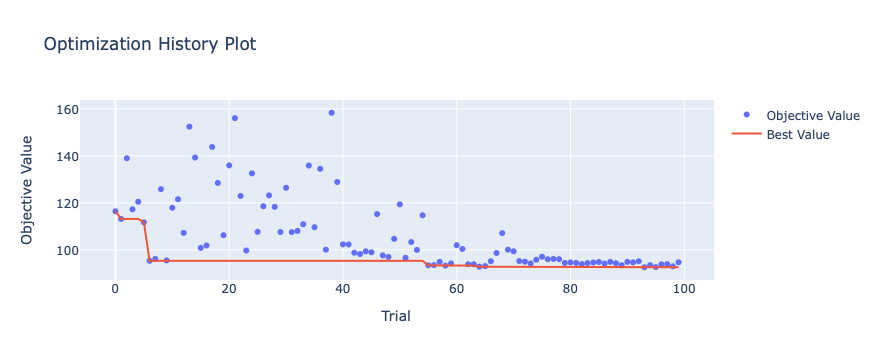

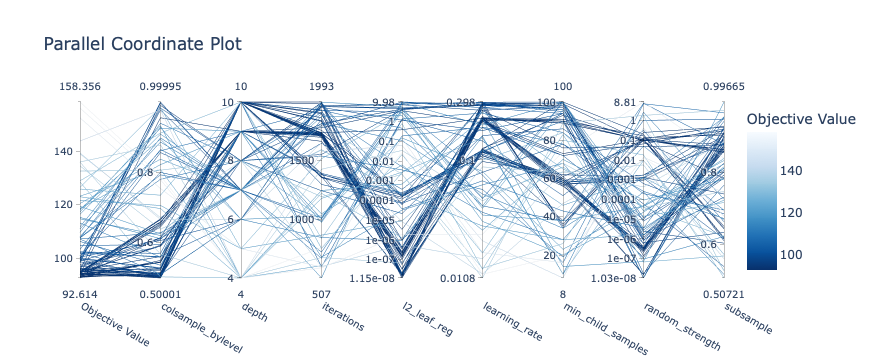

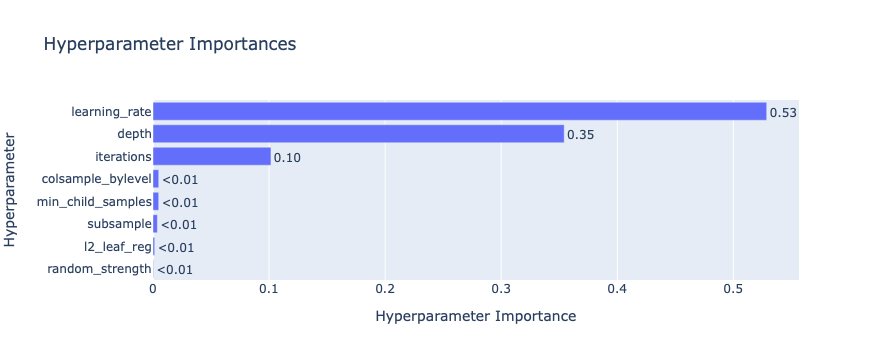

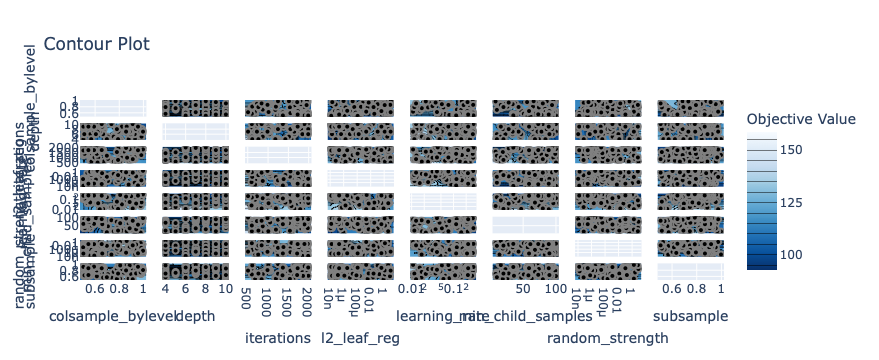

0:	learn: 204.4342288	test: 210.5299927	best: 210.5299927 (0)	total: 66.4ms	remaining: 1m 55s
100:	learn: 109.4660656	test: 119.5787400	best: 119.5787400 (100)	total: 5.55s	remaining: 1m 29s
200:	learn: 96.7096781	test: 109.2067976	best: 109.2067976 (200)	total: 11.1s	remaining: 1m 24s
300:	learn: 89.9738337	test: 104.8520389	best: 104.8520389 (300)	total: 16.7s	remaining: 1m 19s
400:	learn: 84.4294493	test: 101.7844898	best: 101.7844898 (400)	total: 22.3s	remaining: 1m 14s
500:	learn: 80.6197731	test: 99.8194603	best: 99.8194603 (500)	total: 27.9s	remaining: 1m 8s
600:	learn: 77.5517976	test: 98.5838054	best: 98.5838054 (600)	total: 33.5s	remaining: 1m 3s
700:	learn: 74.8999316	test: 97.5067570	best: 97.5065295 (699)	total: 39.2s	remaining: 57.8s
800:	learn: 72.4507001	test: 96.5470638	best: 96.5470638 (800)	total: 44.9s	remaining: 52.3s
900:	learn: 70.3946691	test: 95.9256116	best: 95.9256116 (900)	total: 50.5s	remaining: 46.7s
1000:	learn: 68.4885211	test: 95.2650607	best: 95.261674

In [12]:
import optuna
from catboost import CatBoostRegressor
from sklearn.metrics import root_mean_squared_error, mean_absolute_error
import joblib
from optuna.samplers import TPESampler
import plotly.graph_objects as go
from optuna.visualization import plot_optimization_history, plot_parallel_coordinate, plot_param_importances, plot_contour

def objective(trial):
    # Define the hyperparameters to optimize
    param = {
        'iterations': trial.suggest_int('iterations', 500, 2000),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'depth': trial.suggest_int('depth', 4, 10),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-8, 10.0, log=True),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bylevel': trial.suggest_float('colsample_bylevel', 0.5, 1.0),
        'random_strength': trial.suggest_float('random_strength', 1e-8, 10.0, log=True)
    }
    
    # Create and train model
    model = CatBoostRegressor(
        **param,
        loss_function='RMSE',
        eval_metric='RMSE',
        random_seed=42,
        early_stopping_rounds=50,
        cat_features=categorical_features,
        verbose=0
    )
    
    # Train the model
    model.fit(
        X_train,
        y_train,
        eval_set=(X_val, y_val),
        use_best_model=True
    )
    
    # Predict and calculate RMSE
    val_predictions = model.predict(X_val)
    rmse = root_mean_squared_error(y_val, val_predictions)
    
    return rmse

# Create study object with TPE sampler
study = optuna.create_study(
    direction='minimize',
    sampler=TPESampler(seed=42)
)

# Run hyperparameter optimization
study.optimize(
    objective,
    n_trials=100,
    n_jobs=32,
    timeout=7200
)

# Print optimization results
print("\nBest trial:")
trial = study.best_trial
print(f"\nBest RMSE: {trial.value:.2f}")
print("\nBest hyperparameters:")
for key, value in trial.params.items():
    print(f"    {key}: {value}")

# Save the optimization results
joblib.dump(study, 'catboost_optuna_study.pkl')

# Create visualizations
print("\nGenerating optimization visualizations...")

# 1. Optimization History
history_plot = plot_optimization_history(study)
history_plot.show()

# 2. Parallel Coordinate Plot
parallel_plot = plot_parallel_coordinate(study)
parallel_plot.show()

# 3. Parameter Importances
importance_plot = plot_param_importances(study)
importance_plot.show()

# 4. Contour Plots for the most important parameters
contour_plot = plot_contour(study)
contour_plot.show()

# Train final model with best parameters
best_params = study.best_params
final_model = CatBoostRegressor(
    **best_params,
    loss_function='RMSE',
    eval_metric='RMSE',
    random_seed=42,
    early_stopping_rounds=50,
    cat_features=categorical_features,
    verbose=100
)

# Train the final model
final_model.fit(
    X_train,
    y_train,
    eval_set=(X_val, y_val),
    use_best_model=True
)

# Make predictions and calculate metrics
val_predictions = final_model.predict(X_val)
final_rmse = root_mean_squared_error(y_val, val_predictions)
final_mae = mean_absolute_error(y_val, val_predictions)

print("\nFinal Model Metrics:")
print(f"RMSE: ${final_rmse:.2f}")
print(f"MAE: ${final_mae:.2f}")




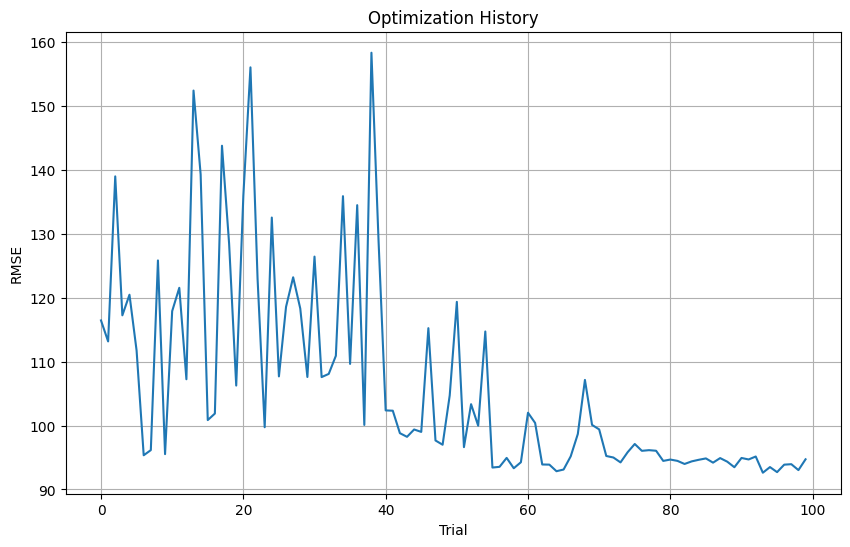

In [13]:
# Save the final model
final_model.save_model('catboost_final_model.cbm')

# Create a visualization of the optimization history
import matplotlib.pyplot as plt

# Plot optimization history
plt.figure(figsize=(10, 6))
optimization_history = [trial.value for trial in study.trials]
plt.plot(optimization_history)
plt.xlabel('Trial')
plt.ylabel('RMSE')
plt.title('Optimization History')
plt.grid(True)
plt.show()

# Plot parameter importances
optuna.visualization.plot_param_importances(study)
plt.show()

In [3]:
from catboost import CatBoostRegressor
from sklearn.model_selection import KFold
from sklearn.metrics import root_mean_squared_error, mean_absolute_error
import numpy as np
import matplotlib.pyplot as plt

# Load the best model
best_model = CatBoostRegressor()
best_model.load_model('../models/catboost_final_model.cbm')


Validation Set Performance:
RMSE: $92.61
MAE: $55.36


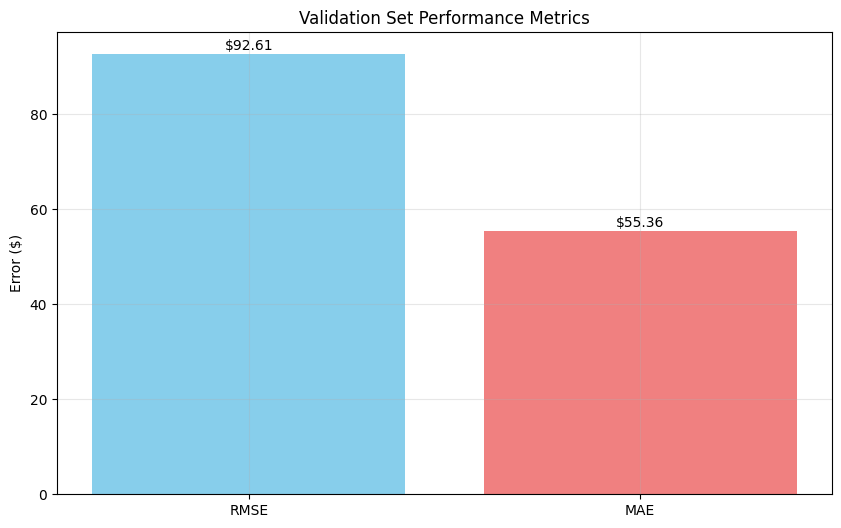

In [16]:
# Simple validation set evaluation
val_predictions = best_model.predict(X_val)
val_rmse = root_mean_squared_error(y_val, val_predictions)
val_mae = mean_absolute_error(y_val, val_predictions)

print("\nValidation Set Performance:")
print(f"RMSE: ${val_rmse:.2f}")
print(f"MAE: ${val_mae:.2f}")

# Create simple visualization
plt.figure(figsize=(10, 6))
metrics = ['RMSE', 'MAE']
values = [val_rmse, val_mae]

bars = plt.bar(metrics, values, color=['skyblue', 'lightcoral'])
plt.ylabel('Error ($)')
plt.title('Validation Set Performance Metrics')
plt.grid(True, alpha=0.3)

# Add value labels on top of bars
for bar, value in zip(bars, values):
    plt.text(bar.get_x() + bar.get_width()/2, 
             value + 1, 
             f'${value:.2f}', 
             ha='center')

plt.show()

In [31]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error

def root_mean_square_error(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    return np.sqrt(mse)

# Make predictions on test set
cat_test_predictions = best_model.predict(X_test)

# Calculate RMSE and MAE
cat_test_rmse = root_mean_square_error(y_test, cat_test_predictions)
cat_test_mae = mean_absolute_error(y_test, cat_test_predictions)

# Display test metrics
print("\nCatBoost Test Set Metrics:")
print(f"RMSE: ${cat_test_rmse:.2f}")
print(f"MAE: ${cat_test_mae:.2f}")

# Show sample predictions
print("\nSample Predictions vs Actual Values:")
sample_size = min(5, len(y_test))
sample_indices = np.random.choice(len(y_test), sample_size, replace=False)
print("\nActual Price vs Predicted Price:")
for idx in sample_indices:
    print(f"Actual: ${y_test.iloc[idx]:.2f}, Predicted: ${cat_test_predictions[idx]:.2f}, "
          f"Difference: ${abs(y_test.iloc[idx] - cat_test_predictions[idx]):.2f}")

# Get feature importance
cat_feature_importance = pd.DataFrame({
    'feature': numerical_features + categorical_features,
    'importance': best_model.get_feature_importance()
})
cat_feature_importance = cat_feature_importance.sort_values('importance', ascending=False)
print("\nTop Features by Importance:")
print(cat_feature_importance)


CatBoost Test Set Metrics:
RMSE: $87.72
MAE: $55.83

Sample Predictions vs Actual Values:

Actual Price vs Predicted Price:
Actual: $248.60, Predicted: $327.89, Difference: $79.29
Actual: $650.20, Predicted: $534.29, Difference: $115.91
Actual: $814.93, Predicted: $764.71, Difference: $50.22
Actual: $519.60, Predicted: $446.34, Difference: $73.26
Actual: $607.10, Predicted: $607.33, Difference: $0.23

Top Features by Importance:
                feature  importance
4   totalTravelDistance   17.759762
13   destinationAirport   16.089018
12      startingAirport   11.676544
9             date_diff    7.393939
0        travelDuration    6.225951
7           day_of_week    5.736645
14           cabin_Leg1    5.338599
10                 hour    5.281865
11               minute    4.751087
8          week_of_year    4.692762
6                   day    3.936789
15           cabin_Leg2    3.910168
16           cabin_Leg3    3.401531
1        isBasicEconomy    1.624883
5                 month   

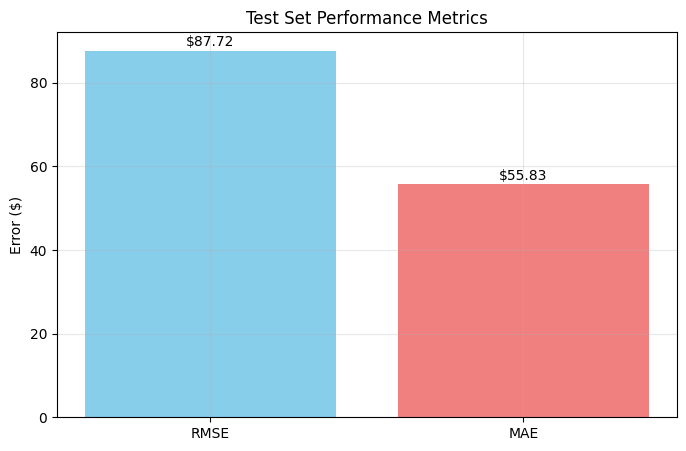

In [33]:
# Create simple bar plot
plt.figure(figsize=(8, 5))
metrics = ['RMSE', 'MAE']
values = [cat_test_rmse, cat_test_mae]

bars = plt.bar(metrics, values, color=['skyblue', 'lightcoral'])
plt.ylabel('Error ($)')
plt.title('Test Set Performance Metrics')
plt.grid(True, alpha=0.3)

# Add value labels on top of bars
for bar, value in zip(bars, values):
    plt.text(bar.get_x() + bar.get_width()/2, 
             value + 1, 
             f'${value:.2f}', 
             ha='center')

plt.show()